In [1]:
import pathlib
import cdmetadl.helpers.general_helpers
import cdmetadl.dataset
import cdmetadl.samplers
import cdmetadl.augmentation
from cdmetadl.notebooks.helpers import generate_edge_map_plot
import os
import plotly.io as pio
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import display

%load_ext autoreload
%autoreload 2
%matplotlib inline  

/fastdata/vilab25/cd-metadl-cyLvmR8c-py3.11/lib/python3.11/site-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/fastdata/vilab25/cd-metadl-cyLvmR8c-py3.11/lib/python3.11/site-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/fastdata/vilab25/cd-metadl-cyLvmR8c-py3.11/lib/python3.11/site-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_11m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_11m_224. This is becau

In [2]:
path_to_dataset = "/fastdata/vilab24/meta-album/"


dataset_path = pathlib.Path(path_to_dataset)
dataset_info_dict = cdmetadl.helpers.general_helpers.check_datasets(dataset_path, ["CRS"])

dataset = cdmetadl.dataset.ImageDataset("Cars", dataset_info_dict["CRS"])

n_way_sampler = cdmetadl.samplers.ValueSampler(value=10)
k_shot_sampler = cdmetadl.samplers.ValueSampler(value=4)

task = dataset.generate_task(n_way_sampler, k_shot_sampler, query_size=4)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]


Augmenting class:   0%|          | 0/5 [00:00<?, ?/s]

3 images: Time taken: 5.513893127441406 seconds
One image: Time taken: 4.732407569885254 seconds


3 images: Time taken: 5.366147994995117 seconds


One image: Time taken: 4.654996871948242 seconds
3 images: Time taken: 5.331482410430908 seconds


One image: Time taken: 4.687379598617554 seconds
3 images: Time taken: 5.371980428695679 seconds


Augmenting class:  20%|██        | 1/5 [44:13<2:56:53, 2653.36s/]

One image: Time taken: 4.601809501647949 seconds


3 images: Time taken: 5.3489837646484375 seconds


One image: Time taken: 4.651922941207886 seconds
3 images: Time taken: 5.41095232963562 seconds


One image: Time taken: 4.686456203460693 seconds
3 images: Time taken: 5.394563913345337 seconds


One image: Time taken: 4.667079448699951 seconds
3 images: Time taken: 5.405813694000244 seconds


Augmenting class:  40%|████      | 2/5 [44:54<55:50, 1116.70s/]  

One image: Time taken: 4.730677366256714 seconds


3 images: Time taken: 5.3768720626831055 seconds


One image: Time taken: 4.651259899139404 seconds
3 images: Time taken: 5.447185277938843 seconds


One image: Time taken: 5.138830184936523 seconds
3 images: Time taken: 7.746502637863159 seconds


One image: Time taken: 5.501838207244873 seconds
3 images: Time taken: 8.019857168197632 seconds


Augmenting class:  60%|██████    | 3/5 [45:42<20:57, 628.76s/] 

One image: Time taken: 5.59415078163147 seconds


3 images: Time taken: 8.303836107254028 seconds


One image: Time taken: 5.498106479644775 seconds
3 images: Time taken: 8.544036149978638 seconds


One image: Time taken: 5.339241981506348 seconds
3 images: Time taken: 8.248806238174438 seconds


One image: Time taken: 5.529950380325317 seconds
3 images: Time taken: 7.930218458175659 seconds


Augmenting class:  80%|████████  | 4/5 [46:38<06:42, 402.53s/]

One image: Time taken: 5.579666614532471 seconds


3 images: Time taken: 5.8111631870269775 seconds


One image: Time taken: 4.635907173156738 seconds
3 images: Time taken: 5.635265350341797 seconds


One image: Time taken: 4.680266857147217 seconds
3 images: Time taken: 5.473332643508911 seconds


One image: Time taken: 4.653059959411621 seconds
3 images: Time taken: 5.527845144271851 seconds


One image: Time taken: 4.623564004898071 seconds


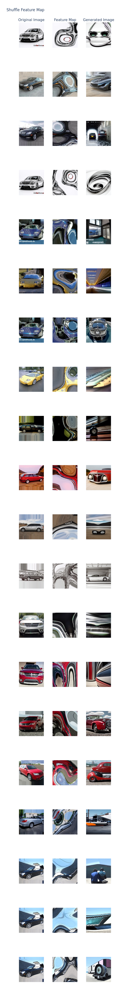

In [14]:
generative_augmentor = cdmetadl.augmentation.GenerativeAugmentation(threshold=0.75, scale=1,
                                                                    annotator_type="shuffle",
                                                                    keep_original_data=False,
                                                                    cache_images=True)
generate_edge_map_plot(generative_augmentor, task, "Shuffle Feature Map")

config.json:   0%|          | 0.00/996 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

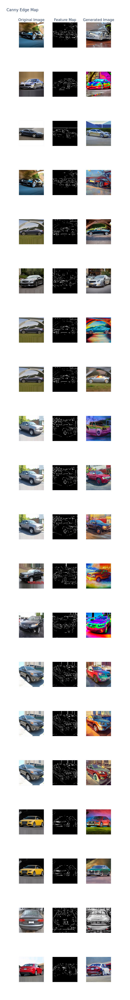

In [4]:
generative_augmentor = cdmetadl.augmentation.GenerativeAugmentation(threshold=0.75, scale=1,
                                                                    annotator_type="canny",
                                                                    keep_original_data=False,
                                                                    cache_images=True, canny_low_threshold=30, canny_high_threshold=100)

generate_edge_map_plot(generative_augmentor, task, "Canny Edge Map")

sam_vit_h_4b8939.pth:   0%|          | 0.00/2.56G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/994 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

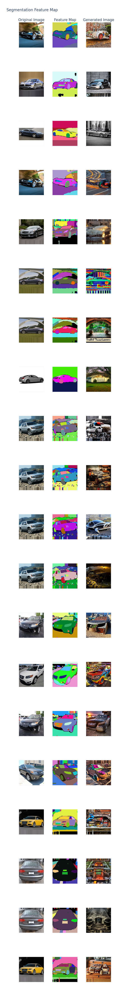

In [5]:
generative_augmentor = cdmetadl.augmentation.GenerativeAugmentation(threshold=0.75, scale=1,
                                                                    annotator_type="segmentation",
                                                                    keep_original_data=False,
                                                                    cache_images=True)
generate_edge_map_plot(generative_augmentor, task, "Segmentation Feature Map")

In [12]:
generative_augmentor = cdmetadl.augmentation.GenerativeAugmentation(threshold=0.75, scale=1,
                                                                    annotator_type="hed",
                                                                    keep_original_data=False,
                                                                    cache_images=True)

generate_edge_map_plot(generative_augmentor, task, "HED Feature Map")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Augmenting class:   0%|          | 0/5 [00:00<?, ?/s]





Augmenting class:  20%|██        | 1/5 [00:12<00:49, 12.35s/]





Augmenting class:  40%|████      | 2/5 [00:24<00:37, 12.48s/]





Augmenting class:  60%|██████    | 3/5 [00:37<00:24, 12.43s/]





Augmenting class:  80%|████████  | 4/5 [00:49<00:12, 12.47s/]


KeyboardInterrupt: 

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

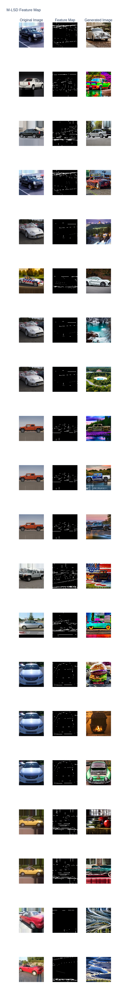

In [ ]:
generative_augmentor = cdmetadl.augmentation.GenerativeAugmentation(threshold=0.75, scale=1,
                                                                    annotator_type="mlsd",
                                                                    keep_original_data=False,
                                                                    cache_images=True, mlsd_distance_threshold=0.1, mlsd_value_threshold=0.1)

generate_edge_map_plot(generative_augmentor, task, "M-LSD Feature Map")

Loading base model ()...Done.
Removing last two layers (global_pool & classifier).


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

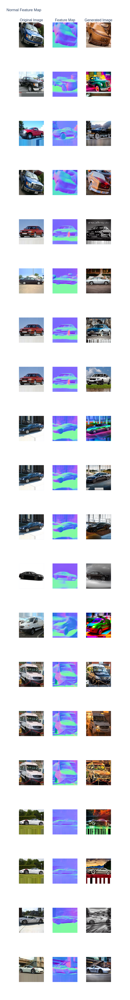

In [ ]:
generative_augmentor = cdmetadl.augmentation.GenerativeAugmentation(threshold=0.75, scale=1,
                                                                    annotator_type="normalbae",
                                                                    keep_original_data=False,
                                                                    cache_images=True)

generate_edge_map_plot(generative_augmentor, task, "Normal Feature Map")